In [1]:
import os
import sys
#sys.path.append(os.path.join(os.getcwd(), '..'))
from ldm.data.deepfashion import DeepFashionSMPL
#from ldm.util import instantiate_from_config
from einops import rearrange
import matplotlib.pyplot as plt
from collections import namedtuple
from copy import deepcopy

import argparse, os, sys, glob
import torch
import numpy as np
from omegaconf import OmegaConf
from PIL import Image
from tqdm import tqdm, trange
from itertools import islice
from einops import rearrange
from torchvision.utils import make_grid
import time
from pytorch_lightning import seed_everything
from torch import autocast
from contextlib import contextmanager, nullcontext

from ldm.util import instantiate_from_config
from ldm.models.diffusion.ddim import DDIMSampler
from ldm.models.diffusion.plms import PLMSSampler


In [2]:
#CONFIG = 'configs/deepfashion/deepfashion_kp_face.yaml'
CKPT = 'logs/2022-12-22T21-30-36_deepfashion_mm_style/checkpoints/last.ckpt'


CONFIG = 'logs/2022-12-22T21-30-36_deepfashion_mm_style/configs/deepfashion_mm_style.yaml'
#CKPT = 'logs/2022-11-26T17-53-05_deepfashion_smpl_face/checkpoints/epoch=000061.ckpt'

In [3]:
def chunk(it, size):
    it = iter(it)
    return iter(lambda: tuple(islice(it, size)), ())


def load_model_from_config(config, ckpt, verbose=False):
    print(f"Loading model from {ckpt}")
    pl_sd = torch.load(ckpt, map_location="cpu")
    if "global_step" in pl_sd:
        print(f"Global Step: {pl_sd['global_step']}")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    if len(m) > 0 and verbose:
        print("missing keys:")
        print(m)
    if len(u) > 0 and verbose:
        print("unexpected keys:")
        print(u)

    model.cuda()
    model.eval()
    return model

class Parser:
    def __init__(self):
        self.d = dict()

    def add_argument(self, varname, **kwargs):
        field_name = varname.split('--')[-1]
        action = kwargs.get('action', None)
            
        if kwargs.get('default') != None:
            self.d[field_name] = kwargs['default']
            #print(f"{field_name}:{kwargs['default']}")
        elif action:
            self.d[field_name] = False

    def parse_args(self):
        return namedtuple('opt', self.d.keys())(*self.d.values())

In [4]:
    parser = Parser()

    parser.add_argument(
        "--prompt",
        type=str,
        nargs="?",
        default="a painting of a virus monster playing guitar",
        help="the prompt to render"
    )

    parser.add_argument(
        "--outdir",
        type=str,
        nargs="?",
        help="dir to write results to",
        default="outputs/txt2img-samples"
    )

    parser.add_argument(
        "--skip_grid",
        action='store_true',
        help="do not save a grid, only individual samples. Helpful when evaluating lots of samples",
    )

    parser.add_argument(
        "--skip_save",
        action='store_true',
        help="do not save indiviual samples. For speed measurements.",
    )

    parser.add_argument(
        "--ddim_steps",
        type=int,
        default=50,
        help="number of ddim sampling steps",
    )

    parser.add_argument(
        "--plms",
        action='store_true',
        help="use plms sampling",
    )
    parser.add_argument(
        "--fixed_code",
        action='store_true',
        help="if enabled, uses the same starting code across all samples ",
    )

    parser.add_argument(
        "--ddim_eta",
        type=float,
        default=0.0,
        help="ddim eta (eta=0.0 corresponds to deterministic sampling",
    )
    parser.add_argument(
        "--n_iter",
        type=int,
        default=1,
        help="sample this often",
    )

    parser.add_argument(
        "--H",
        type=int,
        default=256,
        help="image height, in pixel space",
    )

    parser.add_argument(
        "--W",
        type=int,
        default=256,
        help="image width, in pixel space",
    )

    parser.add_argument(
        "--C",
        type=int,
        default=4,
        help="latent channels",
    )
    parser.add_argument(
        "--f",
        type=int,
        default=8,
        help="downsampling factor, most often 8 or 16",
    )

    parser.add_argument(
        "--n_samples",
        type=int,
        default=8,
        help="how many samples to produce for each given prompt. A.k.a batch size",
    )

    parser.add_argument(
        "--n_rows",
        type=int,
        default=0,
        help="rows in the grid (default: n_samples)",
    )

    parser.add_argument(
        "--scale",
        type=float,
        default=5.0,
        help="unconditional guidance scale: eps = eps(x, empty) + scale * (eps(x, cond) - eps(x, empty))",
    )

    parser.add_argument(
        "--dyn",
        type=float,
        help="dynamic thresholding from Imagen, in latent space (TODO: try in pixel space with intermediate decode)",
    )
    parser.add_argument(
        "--from-file",
        type=str,
        help="if specified, load prompts from this file",
    )
    parser.add_argument(
        "--config",
        type=str,
        default="logs/f8-kl-clip-encoder-256x256-run1/configs/2022-06-01T22-11-40-project.yaml",
        help="path to config which constructs model",
    )
    parser.add_argument(
        "--ckpt",
        type=str,
        default="logs/f8-kl-clip-encoder-256x256-run1/checkpoints/last.ckpt",
        help="path to checkpoint of model",
    )
    parser.add_argument(
        "--seed",
        type=int,
        default=42,
        help="the seed (for reproducible sampling)",
    )
    parser.add_argument(
        "--precision",
        type=str,
        help="evaluate at this precision",
        choices=["full", "autocast"],
        default="autocast"
    )


In [5]:
class Sampler:
    def __init__(self, opt, batch_size=4):
        device = 'cuda'
        self.config = OmegaConf.load(opt.config)
        self.cond_image_keys = self.config.lightning.callbacks.image_logger.params.log_cond_keys
        self.model = load_model_from_config(self.config, f"{opt.ckpt}").to(device)
        self.model.eval()
        
        if batch_size:
            self.config['data']['params']['batch_size'] = batch_size

        data = instantiate_from_config(self.config['data'])
        data.prepare_data()
        data.setup()

        self.dl = iter(data.val_dataloader())
        
    def get_data(self):
        return next(self.dl)
        
    def generate(self, batch, fixes={}, ddim_steps=200, seed=None, plot_denoise_rows=False, 
                    plot_progressive_rows=False, log_every_t=10):
        local_batch = deepcopy(batch)
        for key, value in fixes.items():
            repeat_n = len(local_batch[key])
            x = local_batch[key]
            if type(x) == list:
                if type(value) == str:
                    local_batch[key] = [value] * repeat_n
                elif type(x[value]) == int:
                    local_batch[key] = [x[value]] * repeat_n
                else:
                    raise ValueError
            else:
                dim_n = len(x.shape)-1
                local_batch[key] = x[value].repeat(repeat_n, *[1]*dim_n)

        #def run(batch):
        with torch.no_grad():
            images = self.model.log_images(local_batch, ddim_steps=ddim_steps, inpaint=False, seed=seed,
                                           plot_denoise_rows=plot_denoise_rows, 
                                           plot_progressive_rows=plot_progressive_rows,
                                           log_every_t=log_every_t)
        clamp = True
        k = 'samples'

        if isinstance(images[k], torch.Tensor):
            images[k] = images[k].detach().cpu()
            if clamp:
                images[k] = torch.clamp(images[k], -1., 1.)
            images[k] = rearrange(images[k].detach().cpu().numpy(),'b c h w -> b h w c' ) *0.5 + 0.5

        cond_1_image = local_batch[self.cond_image_keys[0]].numpy()*0.5+0.5
        #cond_2_image = local_batch[self.cond_image_keys[1]].numpy()*0.5+0.5
        #b, h, w, c = cond_2_image.shape
        #cond_1_image[:,:h,:w] = cond_2_image
        concat_images = np.concatenate((cond_1_image, images['samples']), axis=2)
        return concat_images, images
    


In [6]:
parser.d['config'] = CONFIG
parser.d['ckpt'] = CKPT

opt = parser.parse_args()

sampler = Sampler(opt, batch_size=1)

Loading model from logs/2022-12-22T21-30-36_deepfashion_mm_style/checkpoints/last.ckpt
Global Step: 154056
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 425.29 M params.
Keeping EMAs of 688.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
Restored from models/first_stage_models/kl-f8/model.ckpt


Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.8.self_attn.v_proj.bias', 'vision_model.encoder.layers.8.layer_norm2.weight', 'vision_model.encoder.layers.5.self_attn.v_proj.weight', 'vision_model.encoder.layers.19.self_attn.q_proj.bias', 'vision_model.encoder.layers.14.layer_norm1.bias', 'vision_model.encoder.layers.16.self_attn.q_proj.bias', 'vision_model.encoder.layers.3.layer_norm2.bias', 'vision_model.encoder.layers.12.layer_norm1.weight', 'vision_model.encoder.layers.5.layer_norm1.bias', 'vision_model.encoder.layers.3.self_attn.q_proj.weight', 'vision_model.encoder.layers.17.self_attn.k_proj.bias', 'vision_model.encoder.layers.11.self_attn.k_proj.weight', 'vision_model.encoder.layers.10.self_attn.v_proj.weight', 'vision_model.encoder.layers.16.self_attn.out_proj.weight', 'vision_model.encoder.layers.1.self_attn.q_proj.bias', 'vision_model.embeddings.patch_embedding.weight', 'vision_

# Sampling

In [61]:
fixes = {}
#fixes = {'smpl':4, 'smpl_image':4}
#fixes = {'txt': 'the woman is wearing red multi-color jacket'}


batch_1 = sampler.get_data()
#batch_2 = sampler.get_data()
#fixes = {'txt':'the woman is wearing navy blue dress'}
#fixes = {'face_image':1, 'face_embed':1, 'txt':'the woman is wearing navy blue dress'}
#images_1, _ = sampler.generate(batch_1, fixes)


In [62]:
print(batch_1['txt'])

['Her sweater has long sleeves, cotton fabric and pure color patterns. It has a crew neckline. The female wears a three-point shorts. The shorts are with cotton fabric and solid color patterns. The female also wears an outer clothing, with leather fabric and pure color patterns. There is a ring on her finger.']


In [59]:
#batch_1['txt'] = ['a woman wears a sleeveless top and three-pont length short skirt, she hold a handbag']
#batch_1['txt'] = ['Her sweater has long sleeves, cotton fabric and solid color patterns. It has a crew neckline. The shorts the female wears is of three-point length. The shorts are with cotton fabric and floral patterns. The outer clothing is with furry fabric and solid color patterns. The person is wearing a ring on her finger. There is an accessory on her wrist.']

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (1, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:08<00:00, 22.47it/s]

Plotting: Restored training weights


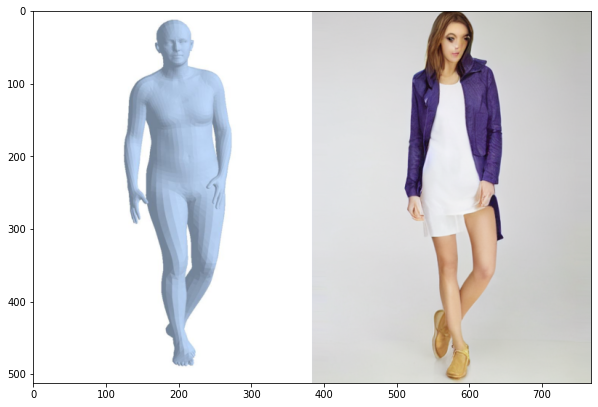

In [70]:
batch_1['styles'] = [['', '','','','']]
batch_1['styles'] = [['','a man','purple long sleeves sweater','white','gold colored shoes']]
images_1, _ = sampler.generate(batch_1)
plt.figure(figsize=(10,10))
plt.imshow(images_1[0])

In [43]:
import clip
model, _ = clip.load('ViT-L/14', jit=False, device="cuda")

In [ ]:
from einops import rearrange, repeat
text = ['','']
tokens = clip.tokenize(text).to('cuda')
z = model.encode_text(tokens)
print(z.shape)
if z.ndim==2:
    z = z[:, None, :]
z = repeat(z, 'b 1 d -> b k d', k=1)
print(z.shape)

In [ ]:
texts = [['', '', '', '', '']]
zs = []
for text in texts:
    tokens = clip.tokenize(text).to('cuda')
    z = model.encode_text(tokens)
    zs.append(z)
z = torch.stack(zs)
print(z.shape)
if z.ndim==2:
    print("lala")
    z = z[:, None, :]
#z = repeat(z, 'b 1 d -> b k d', k=1)
print(z.shape)

In [ ]:
torch.stack(zs).device

In [35]:
zs[0].shape

torch.Size([5, 768])

In [20]:
z.shape

torch.Size([2, 768])

In [47]:
fixes = {}
#fixes = {'smpl':4, 'smpl_image':4}
#fixes = {'txt': 'the woman is wearing red multi-color jacket'}


batch_1 = sampler.get_data()
batch_2 = sampler.get_data()
batch_3 = deepcopy(batch_1)

for k in ['styles']:
    batch_3[k][:,2:] = batch_2[k][:,2:]


In [48]:
styles = deepcopy(batch_1['styles'])

In [61]:
batch_1['styles'] = torch.zeros_like(styles)

In [62]:
batch_1['txt'][3] = 'The shirt the person wears has long sleeves and its fabric is cotton. The pattern of it is solid color. The person wears a long trousers, with cotton fabric and graphic patterns. This female also wears an outer clothing, with knitting fabric and complicated patterns.'

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:27<00:00,  7.26it/s]


Plotting: Restored training weights
He wears a pink tank top with pure color patterns and three-point pants. The tank top is with cotton fabric and it has a crew neckline. The pants are with cotton fabric and pure color patterns.


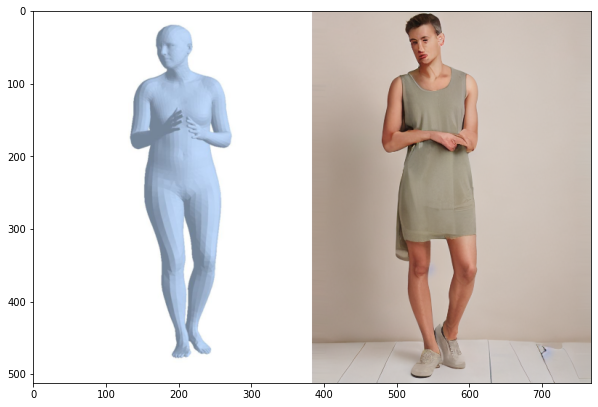

The person is wearing a long-sleeve shirt with pure color patterns and a long trousers. The shirt is with cotton fabric and its neckline is round. The trousers are with cotton fabric and pure color patterns. The person also wears an outer clothing, with cotton fabric and pure color patterns. This man is wearing a hat.


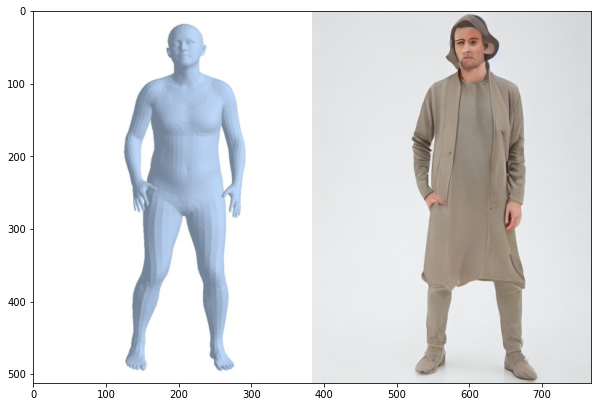

This female is wearing a tank tank top with solid color patterns and a three-point shorts. The tank top is with cotton fabric and its neckline is crew. The shorts are with denim fabric and pure color patterns. There is a ring on her finger.


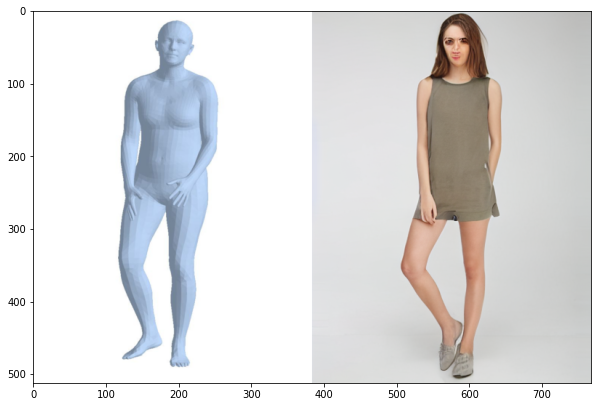

The shirt the person wears has long sleeves and its fabric is cotton. The pattern of it is solid color. The person wears a long trousers, with cotton fabric and graphic patterns. This female also wears an outer clothing, with knitting fabric and complicated patterns.


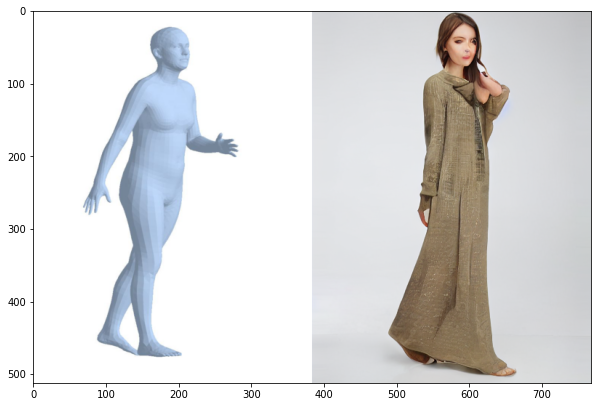

In [63]:
images_1, all_images_1 = sampler.generate(batch_1, fixes)
for i in range(4):
    plt.figure(figsize=(10,10))
    plt.imshow(images_1[i])
    print(batch_1['txt'][i])
    plt.show()

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:27<00:00,  7.27it/s]


Plotting: Restored training weights
He wears a pink tank top with pure color patterns and three-point pants. The tank top is with cotton fabric and it has a crew neckline. The pants are with cotton fabric and pure color patterns.


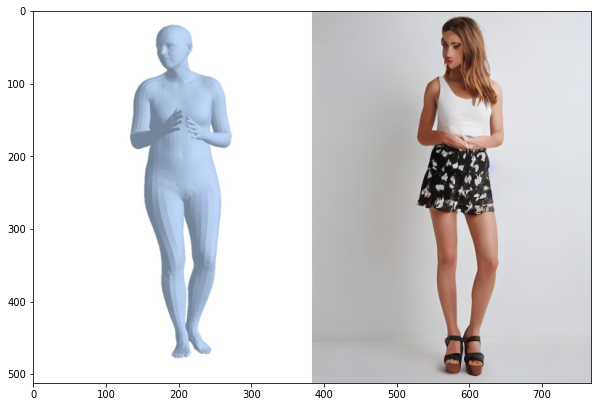

The person is wearing a long-sleeve shirt with pure color patterns and a long trousers. The shirt is with cotton fabric and its neckline is round. The trousers are with cotton fabric and pure color patterns. The person also wears an outer clothing, with cotton fabric and pure color patterns. This man is wearing a hat.


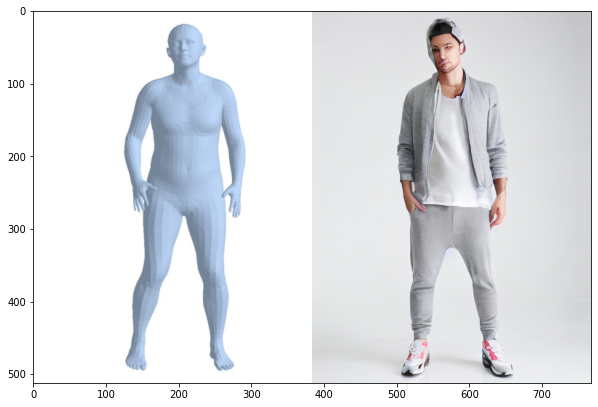

This female is wearing a tank tank top with solid color patterns and a three-point shorts. The tank top is with cotton fabric and its neckline is crew. The shorts are with denim fabric and pure color patterns. There is a ring on her finger.


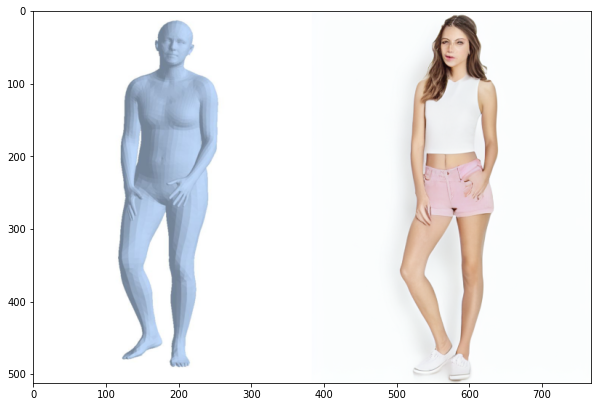

The shirt the person wears has long sleeves and its fabric is cotton. The pattern of it is solid color. The person wears a long trousers, with cotton fabric and graphic patterns. This female also wears an outer clothing, with knitting fabric and complicated patterns. There is an accessory on her wrist. This woman wears a ring. The female has a hat in her head.


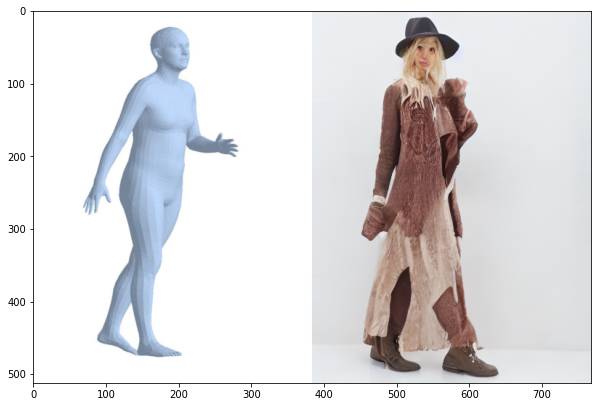

In [60]:
images_1, all_images_1 = sampler.generate(batch_1, fixes)
for i in range(4):
    plt.figure(figsize=(10,10))
    plt.imshow(images_1[i])
    print(batch_1['txt'][i])
    plt.show()

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:27<00:00,  7.30it/s]


Plotting: Restored training weights
Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:27<00:00,  7.17it/s]


Plotting: Restored training weights
Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:28<00:00,  7.09it/s]


Plotting: Restored training weights


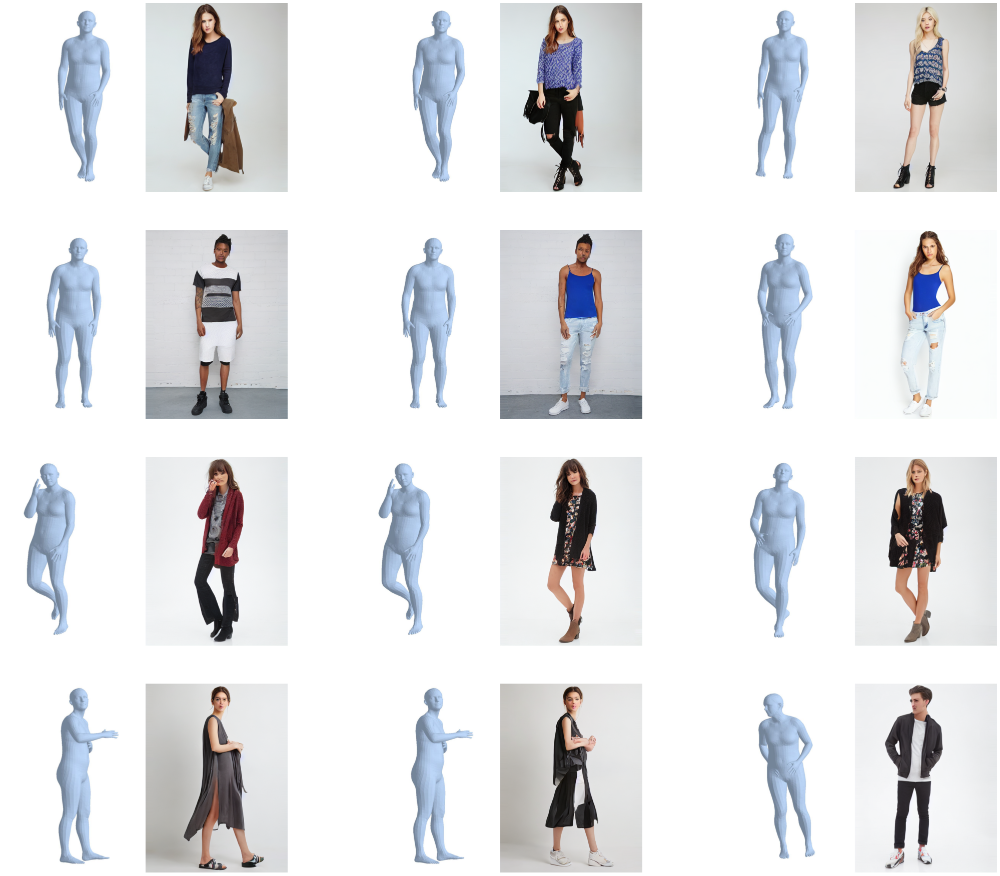

In [29]:
fixes = {}
images_1, all_images_1 = sampler.generate(batch_1, fixes)
images_2, all_images_2 = sampler.generate(batch_2, fixes)
images_3, all_images_3 = sampler.generate(batch_3, fixes)

images = [images_1, images_3, images_2]
cols = 3
rows = len(images[0])

indices = [i for i in range(rows)]
#indices = [5]
rows = len(indices)
f, axarr = plt.subplots(rows, cols)
f.set_figheight(rows*8)
f.set_figwidth(cols*12)

#for i in range(rows):
for i, row in enumerate(indices):
    for j in range(cols):
        if rows == 1:
            ax = axarr[j]
        else:
            ax = axarr[i, j]
        
        #axarr[i, j].imshow(Image.open(pose_paths[index]))
        ax.imshow(images[j][row])
        ax.axis('off')
        title = fixes.get('txt', batch_1['txt'][row])
        #ax.set_title(title)
    #index += 1


# Interpolation

In [12]:
def repeat_features(batch, fixes):
    local_batch = deepcopy(batch)
    for key, value in fixes.items():
        repeat_n = len(local_batch[key])
        x = local_batch[key]
        if type(x) == list:
            if type(value) == str:
                local_batch[key] = [value] * repeat_n
            elif type(x[value]) == int:
                local_batch[key] = [x[value]] * repeat_n
            else:
                raise ValueError
        else:
            dim_n = len(x.shape)-1
            local_batch[key] = x[value].repeat(repeat_n, *[1]*dim_n)
    return local_batch

In [33]:
batch_1 = sampler.get_data()
batch_3 = deepcopy(batch_1)
batch_2 = sampler.get_data()
for k in ['styles']:
    batch_2[k] = deepcopy(batch_1[k])
alpha = 0.5
batch_3['smpl'] = alpha * batch_1['smpl'] + (1 - alpha) * batch_2['smpl']

for k in ['smpl_image']:
    batch_3[k] = torch.zeros_like(batch_3[k])


Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:27<00:00,  7.27it/s]


Plotting: Restored training weights


100%|██████████████████████████████████████████████████████████████████████████████████████| 22/22 [00:07<00:00,  3.04it/s]


Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:28<00:00,  7.13it/s]


Plotting: Restored training weights
Plotting: Switched to EMA weights
Data shape for DDIM sampling is (4, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:28<00:00,  7.11it/s]


Plotting: Restored training weights


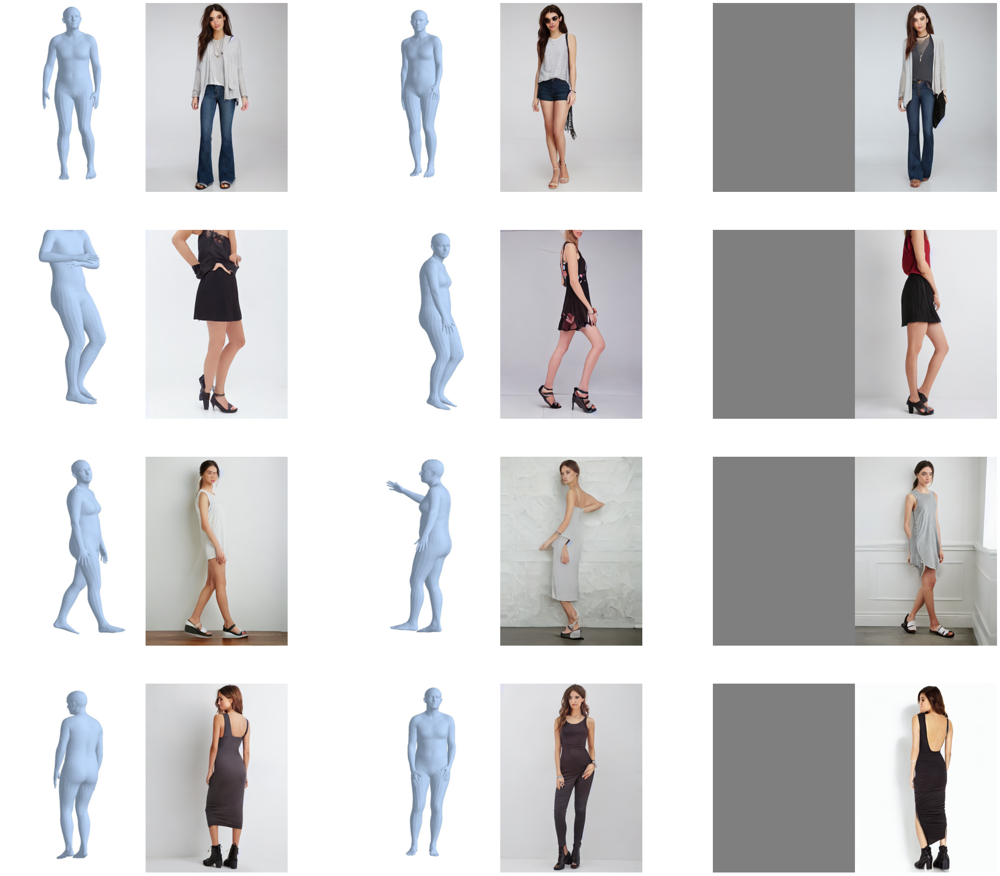

In [34]:
fixes = {}
images_1, all_images_1 = sampler.generate(batch_1, fixes, plot_denoise_rows=True)
images_2, all_images_2 = sampler.generate(batch_2, fixes)
images_3, all_images_3 = sampler.generate(batch_3, fixes)

images = [images_1, images_2, images_3]
cols = 3
rows = len(images[0])

indices = [i for i in range(rows)]
#indices = [5]
rows = len(indices)
f, axarr = plt.subplots(rows, cols)
f.set_figheight(rows*8)
f.set_figwidth(cols*12)

#for i in range(rows):
for i, row in enumerate(indices):
    for j in range(cols):
        if rows == 1:
            ax = axarr[j]
        else:
            ax = axarr[i, j]
        
        #axarr[i, j].imshow(Image.open(pose_paths[index]))
        ax.imshow(images[j][row])
        ax.axis('off')
        title = fixes.get('txt', batch_1['txt'][row])
        #ax.set_title(title)
    #index += 1


# More interpolation

In [15]:
def get_item(batch, index):
    new_dict = dict()
    for k, v in batch.items():
        if type(v) == torch.Tensor:
            new_dict[k] = torch.unsqueeze(v[index], 0)
        elif type(v) == list:
            new_dict[k] = [v[index]]
        else:
            raise "Unimplemented"
    return new_dict

In [59]:
index = 0
start_sample = get_item(batch_1, index)
stop_sample = get_item(batch_2, index)

num_steps = 8
alphas = torch.Tensor(np.linspace(0, 1, num_steps).astype(np.float32))
alphas = alphas.view(-1, 1, 1)

In [65]:
text_prompt = start_sample['txt']#['the woman is wearing a white tee tanks and blue short']
text_prompt =['The man is wearing a long-sleeve sweater with pure color patterns and a long trousers. The sweater is with cotton fabric. The neckline of the sweater is crew. The trousers are with denim fabric and pure color patterns. The outer clothing is with cotton fabric and solid color patterns.']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


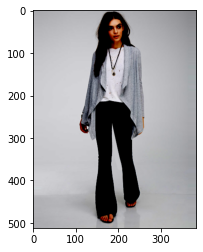

In [66]:
plt.imshow(start_sample['image'][0])

In [67]:
poses = stop_sample['smpl'] * alphas + start_sample['smpl'] * (1 - alphas)
inter_batch = dict()

inter_batch['smpl'] = poses
inter_batch['txt'] = text_prompt * num_steps
inter_batch['image'] = start_sample['image'].repeat(num_steps, 1, 1, 1)
inter_batch['styles'] = start_sample['styles'].repeat(num_steps, 1, 1, 1, 1)
#inter_batch['face_image'] = start_sample['face_image'].repeat(num_steps, 1, 1, 1) 
#inter_batch['face_embed'] = start_sample['face_embed'].repeat(num_steps, 1, 1) 

shapes = list(start_sample['smpl_image'].shape)
shapes[0] = num_steps
inter_batch['smpl_image'] = torch.zeros(shapes)
inter_batch['smpl_image'][0] = start_sample['smpl_image']
inter_batch['smpl_image'][-1] = stop_sample['smpl_image']

In [68]:
inter_images, all_images = sampler.generate(inter_batch, seed=None, plot_denoise_rows=False, \
                                            log_every_t=50, ddim_steps=200)

Plotting: Switched to EMA weights
Data shape for DDIM sampling is (8, 4, 64, 48), eta 1.0
Running DDIM Sampling with 200 timesteps


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████| 200/200 [00:50<00:00,  3.92it/s]


Plotting: Restored training weights


(-0.5, 2815.5, 511.5, -0.5)

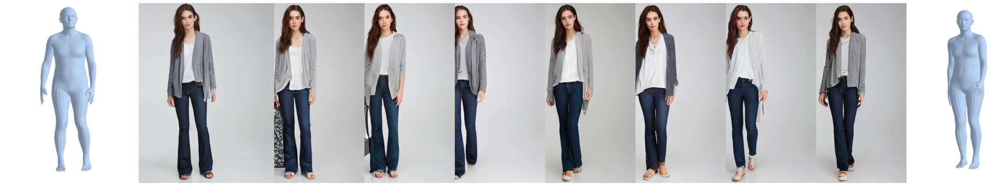

In [69]:
concat_image = inter_images[0]
for i in range(1, len(inter_images)-1):
    concat_image = np.concatenate((concat_image, inter_images[i][:,-256:,:]), 1)
concat_image = np.concatenate((concat_image, inter_images[-1][:,-256:], inter_images[-1][:,:256]), 1)

f, axarr = plt.subplots(1, 1)
f.set_figheight(8)
f.set_figwidth(40)

axarr.imshow(concat_image)
axarr.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


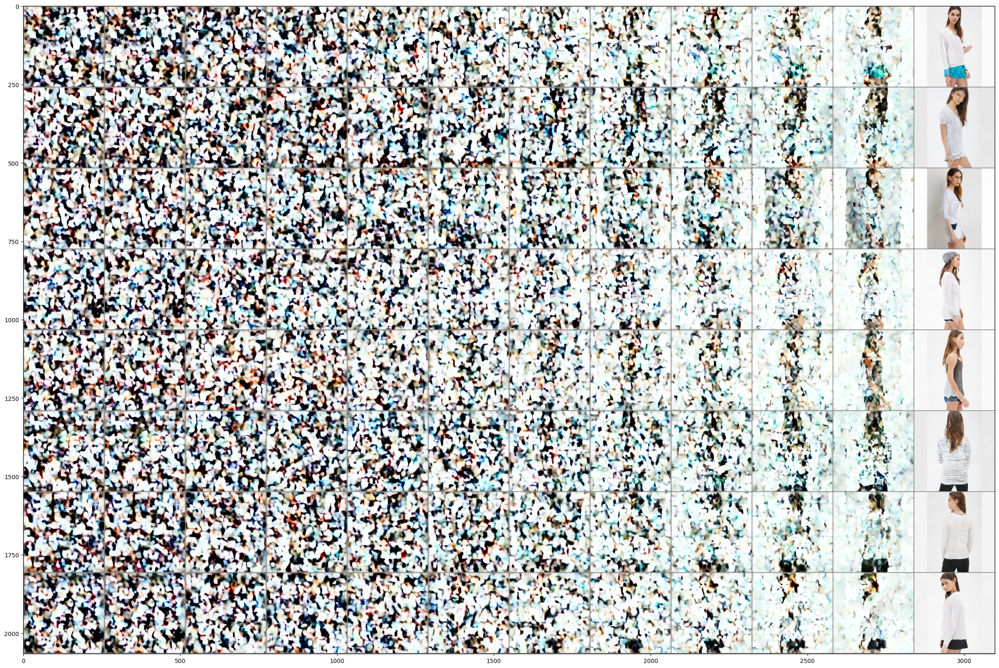

In [24]:
x = rearrange(all_images['denoise_row'].detach().cpu().numpy(),'c h w -> h w c' ) *0.5 + 0.5
plt.figure(figsize=(200,20))
plt.imshow(x)

In [19]:
all_images.keys()

dict_keys(['inputs', 'reconstruction', 'diffusion_row', 'samples', 'denoise_row'])

In [20]:
all_images['denoise_row'].shape

torch.Size([3, 2066, 1034])

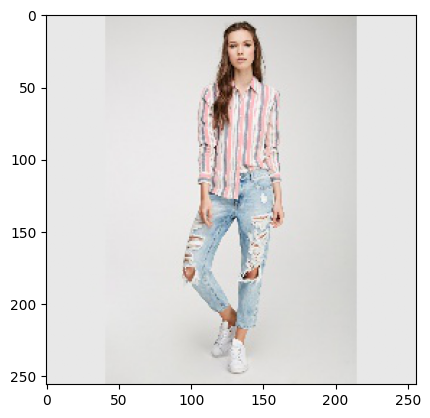

In [48]:
x = rearrange(all_images['inputs'][3].detach().cpu().numpy(),'c h w -> h w c' ) *0.5 + 0.5
plt.imshow(x)

In [19]:
sampler.model.image_size

32

In [25]:
torch.randn((1,8,32,32)).repeat((4,1,1,1)).shape

torch.Size([4, 8, 32, 32])